# Evaluate the model performance

In [1]:
import sys
import os
import numpy as np
import random
import pandas as pd
import dask.array as da
import xarray as xr
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt
from IPython.display import HTML

In [2]:
from visualize import visualize_eval, visual_results, snapshot_muti, visualize_loss
from readfile import read_eval, read_loss

## Error metrics (mse and R2)

### Comparison between two dataloaders 

* sliding window : overlap with interval 1

* rolling window : not overlap

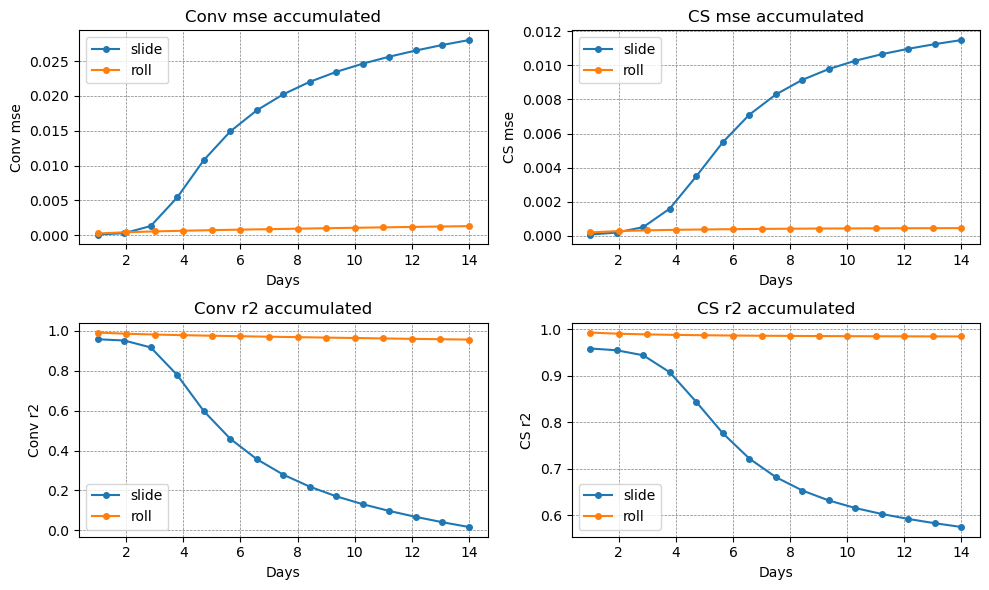

In [7]:
# Compare dataloader
model = ['Conv', 'CS']
fig, axes = plt.subplots(2, len(model), figsize=(10,6))
for i, name in enumerate(model):
    days, res_s = read_eval(f"../../output1/test_logs/{name}_8x14.txt", False)
    days, res_r = read_eval(f"../../output2/test_logs/{name}_8x14.txt")
    mses = {"slide": res_s['mse'], "roll": res_r['mse']}
    r2s = {"slide": res_s['r2'], "roll": res_r['r2']}
    visualize_eval(days, mses, f"{name} mse", axes[0][i])
    visualize_eval(days, r2s, f"{name} r2", axes[1][i])

plt.tight_layout()
plt.show()

### Attention experiment

* Conv: ConvLSTM without any attention mechanism
* CA: ConvLSTM with channel attention 
* SA: ConvLSTM with spatial attention
* CS: ConvLSTM with CBAM 
* TA: ConvLSTM with temporal attention 
* CSTA: ConvLSTM with CBAM and temporal attention

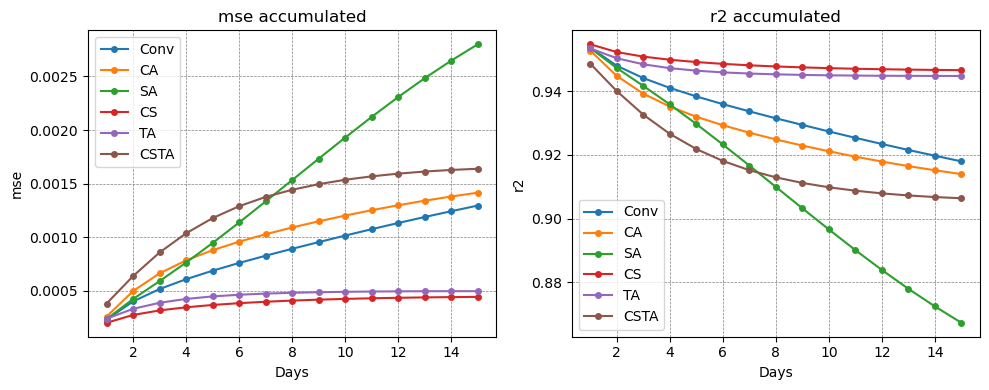

In [6]:
errs = {"mse":{}, "r2":{}}
model = ['Conv', 'CA', 'SA', 'CS', 'TA', 'CSTA']
for name in model:
    days, results = read_eval(f"../../output2/test_logs/{name}_8x14.txt", False)
    errs["mse"][name] = results['mse']
    errs["r2"][name] = results['r2']
fig, axes = plt.subplots(1,2, figsize=(10,4))
for k, ax in zip(errs.keys(), axes.ravel()):
    visualize_eval(days, errs[k], k, ax)
plt.tight_layout()
plt.show()

### Hypertune of the CS model

Final choice: 

* num_layer = 3
  
* lr = 0.001

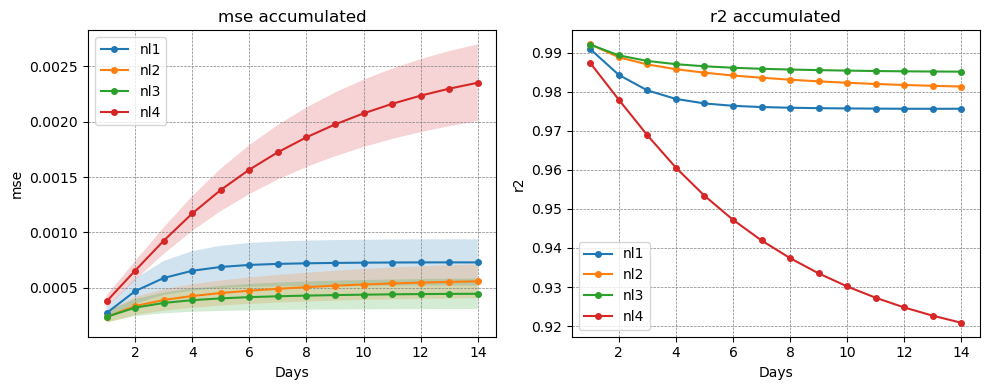

In [7]:
# CS num layer
errs = {"mse":{}, "r2":{}, "std":{}}
model = ['nl1', 'nl2', 'nl3', 'nl4']
for name in model:
    days, results = read_eval(f"../../output/CS_nl/test_logs/{name}_8x14.txt")
    errs["mse"][name] = results['mse']
    errs["r2"][name] = results['r2']
    errs["std"][name] = results['std']
fig, axes = plt.subplots(1,2, figsize=(10,4))
visualize_eval(days, errs['mse'], 'mse', axes[0], errs['std'])
visualize_eval(days, errs['r2'], 'r2', axes[1])
plt.tight_layout()
plt.show()

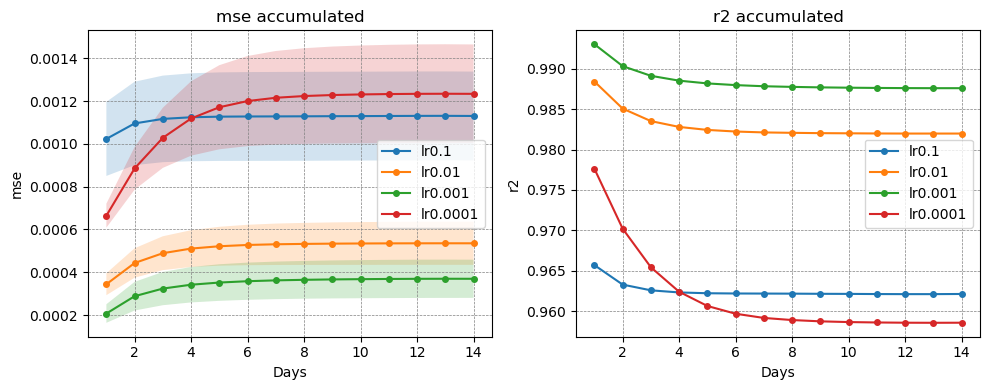

In [7]:
# CS learning rate
errs = {"mse":{}, "r2":{}, "std":{}}
model = [f'lr{i}' for i in [0.1, 0.01, 0.001, 0.0001]]
for name in model:
    days, results = read_eval(f"../../output/hyper/test_logs/{name}_8x14.txt")
    errs["mse"][name] = results['mse']
    errs["r2"][name] = results['r2']
    errs["std"][name] = results['std']
fig, axes = plt.subplots(1,2, figsize=(10,4))
visualize_eval(days, errs['mse'], 'mse', axes[0], errs['std'])
visualize_eval(days, errs['r2'], 'r2', axes[1])
plt.tight_layout()
plt.show()

### The final performance of CS

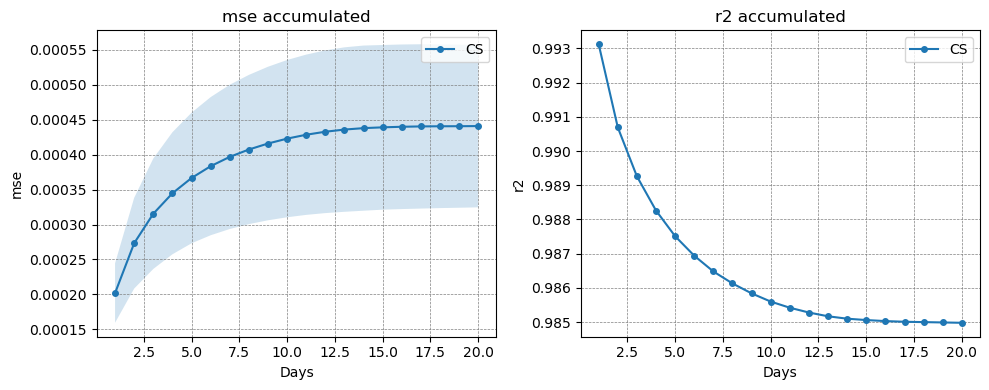

In [11]:
# CS in 20 days
# ../output2: seq8
errs = {"mse":{}, "r2":{}, "std":{}}
model = ['CS']
for name in model:
    days, results = read_eval(f"../../output2/test_logs/{name}_8x100.txt")
    errs["mse"][name] = results['mse'][:20]
    errs["r2"][name] = results['r2'][:20]
    errs["std"][name] = results['std'][:20]
days = days[:20]
fig, axes = plt.subplots(1,2, figsize=(10,4))
visualize_eval(days, errs['mse'], 'mse', axes[0], errs['std'])
visualize_eval(days, errs['r2'], 'r2', axes[1])
plt.tight_layout()
plt.show()

### Comparison among different lengths of sequences

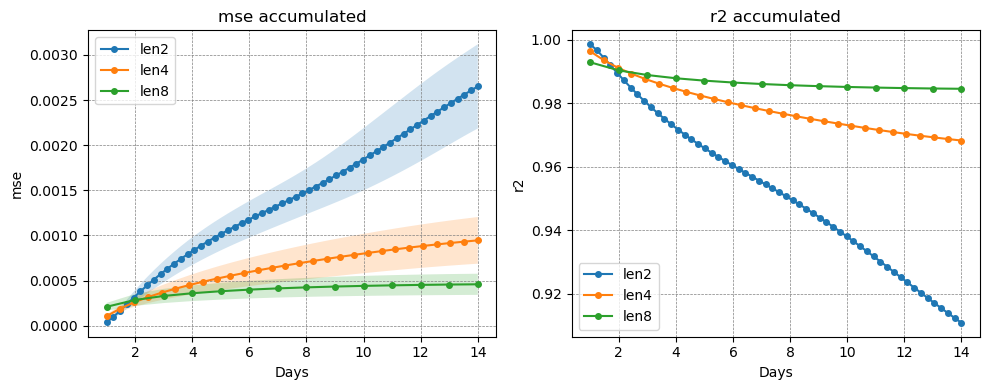

In [8]:
# compare different seqlen
errs = {"mse":{}, "r2":{}, "std":{}}
model = 'CS'
for seqlen, fn in zip([2,4,8], ['2x56', '4x28', '8x14']):
    days, results = read_eval(f"../../output2/test_logs/{name}_{fn}.txt")
    errs["mse"][f"len{seqlen}"] = results['mse']
    errs["r2"][f"len{seqlen}"] = results['r2']
    errs["std"][f"len{seqlen}"] = results['std']

fig, axes = plt.subplots(1,2, figsize=(10,4))
visualize_eval(days, errs['mse'], 'mse', axes[0], errs['std'])
visualize_eval(days, errs['r2'], 'r2', axes[1])
plt.tight_layout()
plt.show()

## Loss

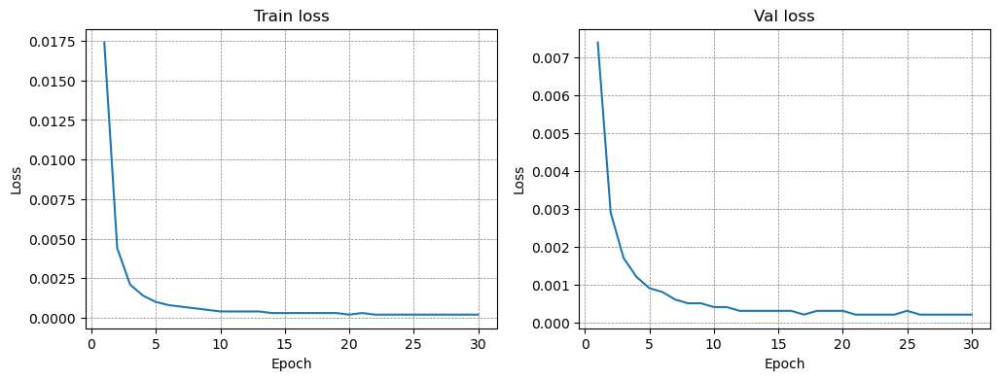

In [3]:
epochs, results = read_loss(f'../../output/hyper/train_logs/lr0.001_8.txt')
fig, ax = plt.subplots(1,2, figsize=(12,4))
visualize_loss(epochs, results['Train loss'], ax[0], "Train loss")
visualize_loss(epochs, results['Val loss'], ax[1], "Val loss")

## Visualization

In [5]:
ds_gt = xr.open_dataset("../../data/resample/total_column_methane.nc")
ds = xr.open_dataset("../../output2/predictions/CS_8x100.nc")
time_point = ds['time'][0].values
ani = visual_results(time_point, ds, ds_gt, 20)
HTML(ani.to_jshtml())

0.0009562398814766792 1.7853909912990407e-09


In [7]:
# ani.save('../../figs/diff_20.gif', writer='pillow', fps=4)

In [3]:
ds_gt = xr.open_dataset("../data/resample/total_column_methane.nc")
ds_pred = xr.open_dataset("../output2/predictions/CS_8x100.nc")
time_point = pd.to_datetime(ds_pred['time'].values[0])
ds_pred = ds_pred.sel(time=time_point)
diff = {}
for day in [1,3,6,10,15,20]:
    pred = ds_pred[f'd{day}'].values
    gt = ds_gt.sel(time=time_point+pd.Timedelta(days=day))
    diff[f'Day{day}'] = np.abs(pred - gt['tc_ch4'].values)
    

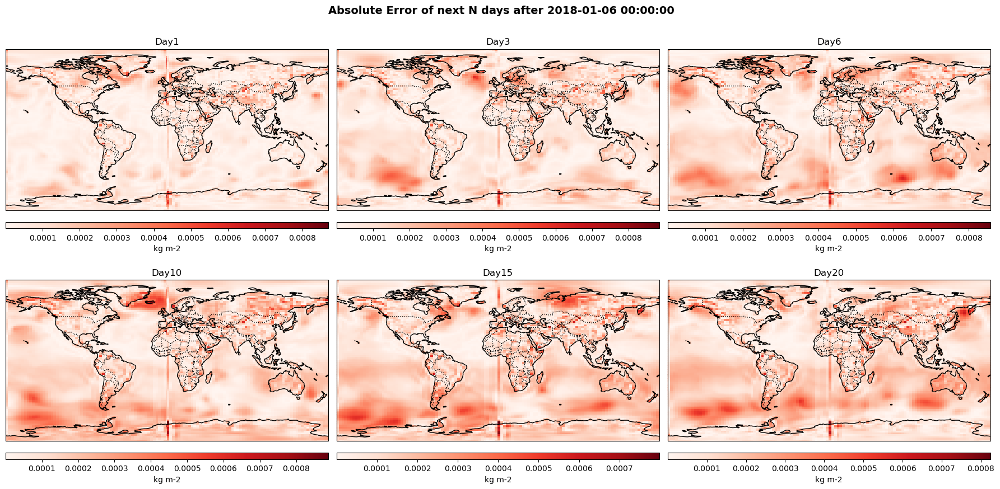

In [6]:
lon = ds_gt['longitude']
lat = ds_gt['latitude']
snapshot_muti(lon, lat, diff, f"Absolute Error of next N days after {str(time_point)}")